In [1]:
import pandas as pd

import math

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.externals import joblib
from sklearn.linear_model import LinearRegression
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import log_loss

import PreprocessText

from wordcloud import WordCloud

In [2]:
df = pd.read_pickle('data/EPMC/eye_in_new_keywords.pkl')
df.set_index('pmid',inplace=True)
df = df[~df.index.isnull()]
pubYear = df['firstPublicationDate']
del df

pubYear = pd.to_datetime(pubYear)
pubYear = pubYear.dt.year

In [3]:
abstracts = pd.read_pickle('data/EPMC/eye_in_new_keywords_ABSTRACTS_LEMMA.pkl')
pmids = abstracts.index
del abstracts

countvec = joblib.load('models/sklearn/CountVec.joblib')
features = countvec.get_feature_names()

countvec_vectors = pd.read_pickle('data/EPMC/eye_in_new_keywords_ABSTRACTS_COUNTVEC.pkl')

lda = joblib.load('models/sklearn/LDA_50topics_alleyekw.joblib')
#lda = joblib.load('models/sklearn/LDA_ncomponents_100.joblib') 

topics = pd.DataFrame(lda.components_,columns=features)

#lda_vectors = pd.read_pickle('data/EPMC/eye_in_new_keywords_ABSTRACTS_LDAVEC.pkl')
lda_vectors = lda.transform(countvec_vectors)
lda_vectors = pd.DataFrame(lda_vectors,index=pmids)

pubYear = pubYear[pubYear.index.isin(pmids)]
pmids = pmids[pmids.isin(pubYear.index)]
lda_vectors = lda_vectors.loc[pmids]

print(lda_vectors.shape)

(364988, 50)


/opt/anaconda/envs/Python3/lib/python3.6/site-packages/matplotlib/pyplot.py:522: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


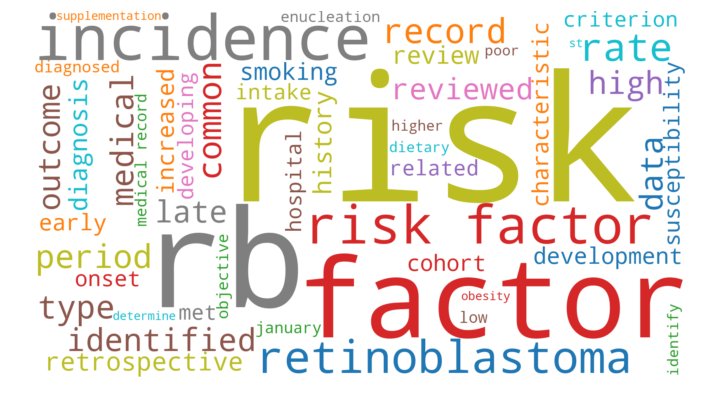

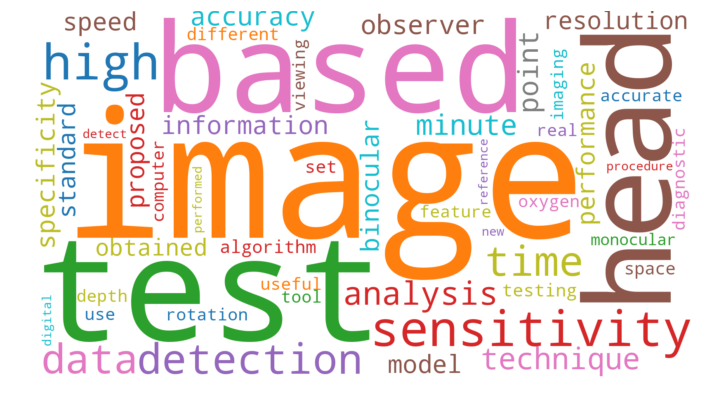

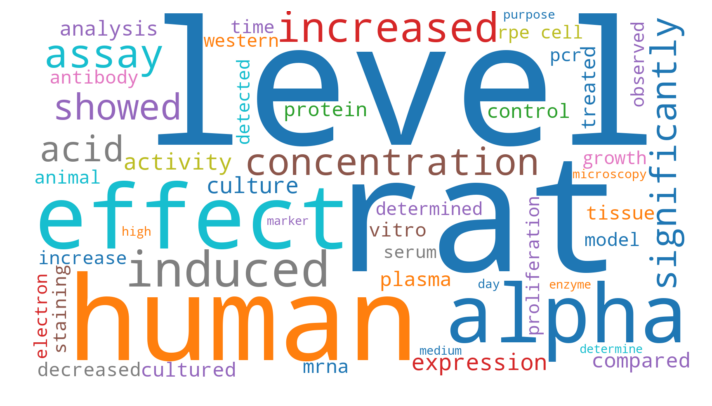

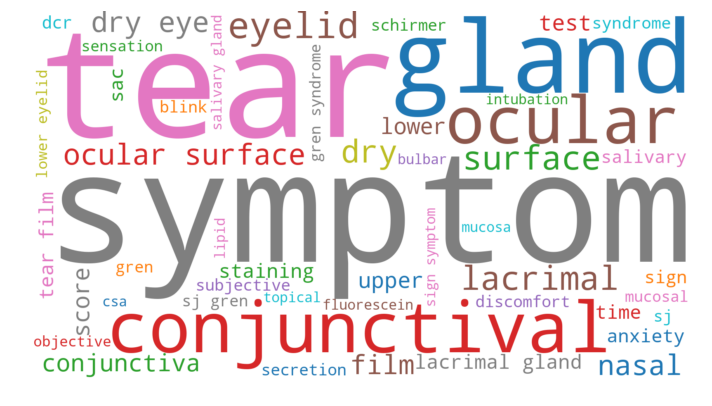

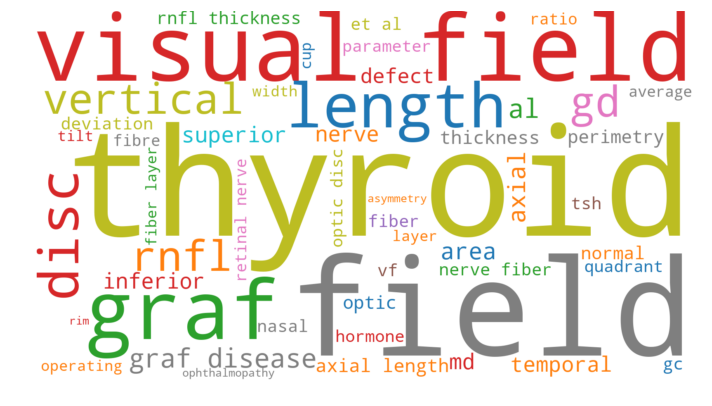

...

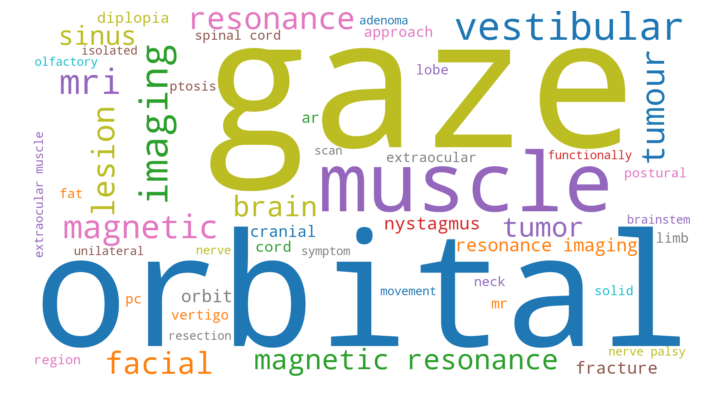

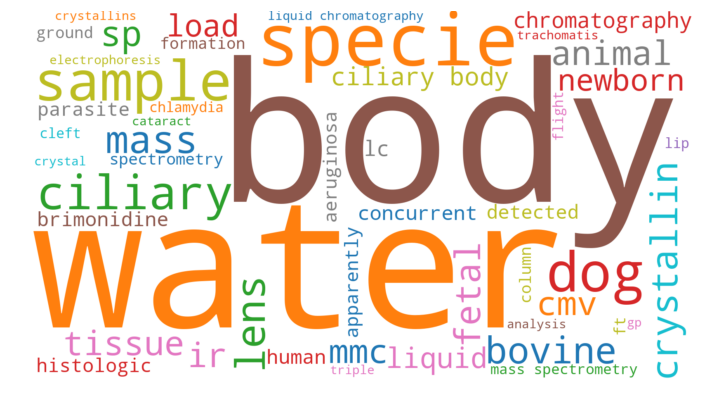

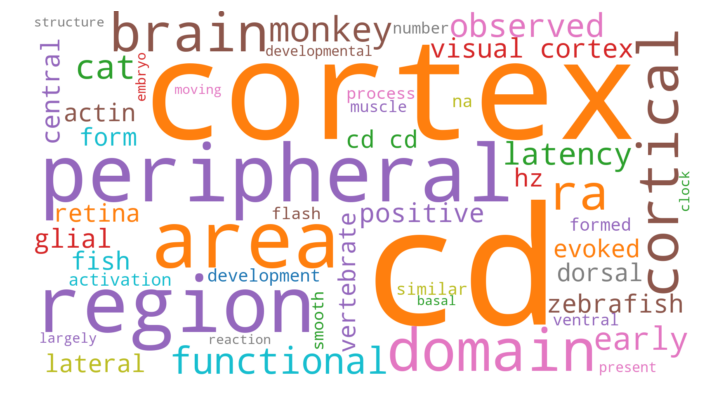

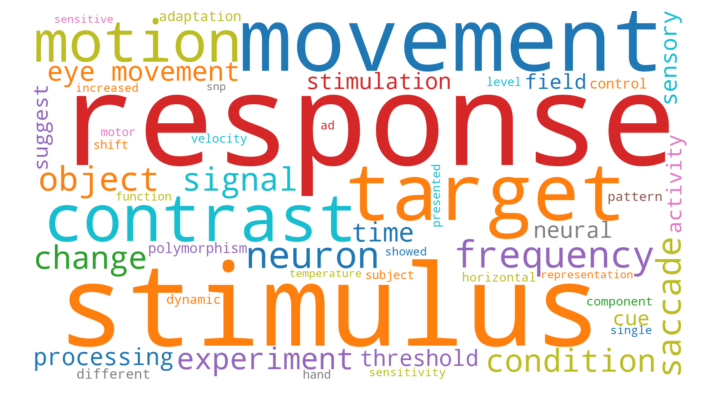

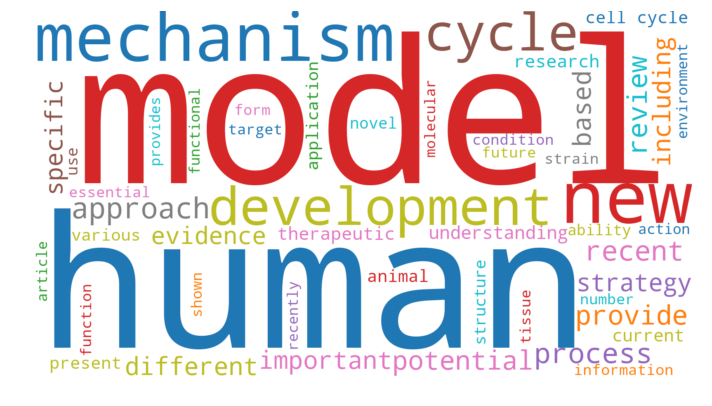

In [9]:
width=1600 
height=900 
prefer_horizontal=0.9
max_words=50
min_font_size=8
max_font_size=None
font_step=1
background_color='white'
relative_scaling='auto'
colormap='tab10'

for i in range(len(topics)):
    text = topics.iloc[i].sort_values(ascending=False).to_dict()

    # Generate a word cloud image
    wordcloud = WordCloud(width=width, 
                          height=height,
                          prefer_horizontal=prefer_horizontal,
                          max_words=max_words,
                          min_font_size=min_font_size,
                          max_font_size=max_font_size,
                          font_step=font_step,
                          background_color=background_color,
                          relative_scaling=relative_scaling,
                          colormap=colormap).generate_from_frequencies(text)

    # Display the generated image:
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.tight_layout()
    #plt.title('TOPIC '+str(i))
    plt.savefig('plots/wordcloud/topic_'+str(i)+'.png',dpi=300)

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


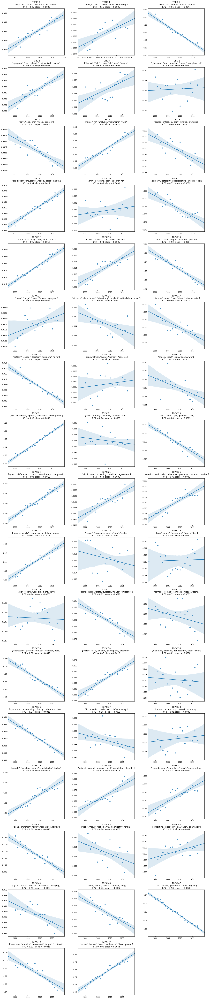

In [5]:
mean_topic_by_year = 30*lda_vectors.groupby(pubYear).mean() # [lda_vectors.max(axis=1)>0.3]
mean_topic_by_year = mean_topic_by_year[(mean_topic_by_year.index>1999) & (mean_topic_by_year.index<2018)]

topic_by_year = lda_vectors[lda_vectors.max(axis=1)>0.1]
topic_by_year = topic_by_year>0.1
topic_by_year = topic_by_year.groupby(pubYear[lda_vectors.max(axis=1)>0.1]).mean()
topic_by_year = topic_by_year[(topic_by_year.index>1999) & (topic_by_year.index<2018)]

ncolumns=3
nrows = math.ceil(len(mean_topic_by_year.columns))

plt.figure(figsize=(6*ncolumns,5*nrows))

reg = LinearRegression()

for i,column in enumerate(mean_topic_by_year.columns):    
    X = topic_by_year[column].index.values
    y = topic_by_year[column].values
    
    plt.subplot(nrows,ncolumns,i+1)
    sns.regplot(x=X, y=y)

    reg.fit(X.reshape(-1, 1), y)
    score = reg.score(X.reshape(-1, 1), y)
    slope = reg.coef_[0]
    
    top5_words = topics.loc[i].sort_values(ascending=False).head(5).index.tolist()
    title = 'TOPIC {:d}\n{:s}\nR^2 = {:.2f}, slope = {:.4f}'.format(column,str(top5_words),score,slope)
    plt.title(title)
    
    plt.tight_layout()


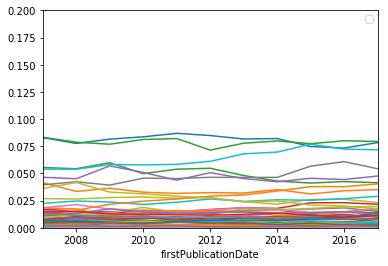

In [21]:
lda_vectors[lda_vectors.max(axis=1)>0.3].idxmax(axis=1).groupby(pubYear).value_counts(sort=False,normalize=True).unstack().plot()
plt.xlim([2007, 2017])
plt.ylim([0.0, 0.2])
plt.legend('')

In [22]:
for key,topic in topics.iterrows():
    print('--------------------')
    print('TOPIC',key)
    print('--------------------')
    print(topic.sort_values(ascending=False).head(20))
    

--------------------
TOPIC 0
--------------------
risk              53118.238889
rb                29190.290635
factor            27603.704423
incidence         20674.069600
risk factor       18202.546820
retinoblastoma    15202.021489
rate              11140.908204
record             8617.963233
common             8007.049779
period             7877.990042
type               7669.565520
identified         7326.588901
medical            7239.317363
data               7220.085444
high               7152.760054
late               6820.016383
outcome            6787.579629
reviewed           6195.547034
retrospective      5780.387203
diagnosis          5614.867509
Name: 0, dtype: float64
--------------------
TOPIC 1
--------------------
image          36935.256785
test           26024.302967
based          18093.476657
head           16782.188385
sensitivity    13643.555279
high           13557.161660
detection      13330.290310
time           13156.990839
data           12874.313943
anal

model            32822.160313
human            27353.791845
new              25195.131763
mechanism        23653.729482
development      22613.759519
cycle            22064.363580
approach         20715.015377
process          19544.432891
recent           18722.754324
review           18059.722581
provide          17752.895882
potential        17194.788593
based            15841.623428
different        15304.515298
important        15225.505649
including        14803.968623
strategy         14586.614734
evidence         14229.202358
specific         14215.436158
understanding    14194.672007
Name: 49, dtype: float64


In [4]:
topics['retinoblastoma'].sort_values(ascending=False).head(5)

0     15202.021489
12        0.020000
22        0.020000
21        0.020000
20        0.020000
Name: retinoblastoma, dtype: float64

In [24]:
topics.loc[27].sort_values(ascending=False).head(50)

month               76950.113995
acuity              56654.622759
visual acuity       50726.075376
follow              30174.000055
mean                25078.685066
outcome             21682.409913
baseline            16556.574693
improvement         15108.825914
treated             14394.306233
improved            12113.137758
corrected           11977.756811
best                11904.322792
va                  11339.334359
efficacy             9286.570621
corrected visual     8998.085343
change               8917.425277
better               8423.782276
bcva                 8422.382067
best corrected       8132.122656
week                 8095.669560
period               8078.318758
visit                7567.413509
line                 6812.524498
safety               6246.629927
eye patient          6242.060043
final                6190.578203
measure              6133.395029
received             6095.891615
evaluate             5864.217189
included             5860.065627
outcome me

## ffs

In [6]:
ffs = pd.read_pickle('data/EPMC/ffs_or_predecessors.pkl')
ffs.set_index('pmid',inplace=True)
ffs = ffs[~ffs.index.isnull()]
print(ffs.shape)

ffs_abstracts = ffs['abstractText']
ffs_abstracts = PreprocessText.lemmatize_abstracts(ffs_abstracts)

ffs_pmids = ffs_abstracts.index

ffs_pubYear = ffs['firstPublicationDate']
ffs_pubYear = pd.to_datetime(ffs_pubYear)
ffs_pubYear = ffs_pubYear.dt.year

ffs_pubYear = ffs_pubYear[ffs_pubYear.index.isin(ffs_pmids)]
ffs_pmids = ffs_pmids[ffs_pmids.isin(ffs_pubYear.index)]

ffs_abstracts = ffs_abstracts.loc[ffs_pmids]

del ffs

print(ffs_abstracts.shape)

(1563, 14)
Removing missing abstracts
Initial preprocessing: case, punctuation, whitespace
Lemmatizing
(1471,)


In [16]:
print('count')
ffs_count = countvec.transform(ffs_abstracts)

print('lda')
ffs_lda = lda.transform(ffs_count)
print('done')

del ffs_count
del countvec
del lda
del ffs_abstracts

ffs_lda = pd.DataFrame(ffs_lda, index=ffs_pmids)
ffs_lda.head()

count
lda
done


,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
pmid,,,,,,,,,,,,,,,,,,,,,
29423837,0.000132,0.000132,0.124738,0.005879,0.000132,0.000132,0.000132,0.050070,0.050965,0.000132,...,0.088486,0.000132,0.020236,0.007543,0.000132,0.010173,0.000132,0.028631,0.000132,0.069780
29164803,0.000116,0.000116,0.080841,0.000116,0.000116,0.000116,0.060768,0.000116,0.000116,0.000116,...,0.027555,0.000116,0.000116,0.020501,0.000116,0.019120,0.000116,0.000116,0.000116,0.200001
29374201,0.000167,0.000167,0.029298,0.000167,0.000167,0.000167,0.000167,0.000167,0.000167,0.000167,...,0.000167,0.146547,0.011751,0.000167,0.000167,0.009027,0.000167,0.014204,0.013644,0.081107
29133296,0.013188,0.019302,0.177037,0.000148,0.000148,0.000148,0.000148,0.000148,0.000148,0.020357,...,0.000148,0.000148,0.000148,0.000148,0.000148,0.000148,0.008571,0.091726,0.035803,0.061774
30060843,0.000124,0.000124,0.123008,0.000124,0.000124,0.000124,0.000124,0.238173,0.000124,0.000124,...,0.000124,0.000124,0.125391,0.000124,0.000124,0.019380,0.015347,0.000124,0.000124,0.052983


In [7]:
ffs_topic_by_year = 30*ffs_lda.groupby(pubYear).mean() # [lda_vectors.max(axis=1)>0.3]
ffs_topic_by_year = ffs_topic_by_year[(ffs_topic_by_year.index>2007) & (ffs_topic_by_year.index<2018)]

ffs_topic_by_year = ffs_lda[ffs_lda.max(axis=1)>0.1]
ffs_topic_by_year = ffs_topic_by_year>0.1
ffs_topic_by_year = ffs_topic_by_year.groupby(ffs_pubYear[ffs_lda.max(axis=1)>0.1]).mean()
ffs_topic_by_year = ffs_topic_by_year[(ffs_topic_by_year.index>2007) & (ffs_topic_by_year.index<2018)]


plt.figure(figsize=(6*ncolumns,5*nrows))

for i,column in enumerate(topic_by_year.columns):    
    X_eyekw = topic_by_year[column].index.values
    y_eyekw = topic_by_year[column].values

    X_ffs = ffs_topic_by_year[column].index.values
    y_ffs = ffs_topic_by_year[column].values

    plt.subplot(nrows,ncolumns,i+1)
    sns.regplot(x=X_eyekw, y=y_eyekw,label='eyekw')
    sns.regplot(x=X_ffs, y=y_ffs,label='ffs')

    plt.legend()
    
    top5_words = topics.loc[i].sort_values(ascending=False).head(5).index.tolist()
    title = 'TOPIC {:d}\n{:s}'.format(column,str(top5_words))
    plt.title(title)
    plt.xlim([2008,2017])
    
    plt.tight_layout()


NameError: name 'ffs_lda' is not defined

/opt/anaconda/envs/Python3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


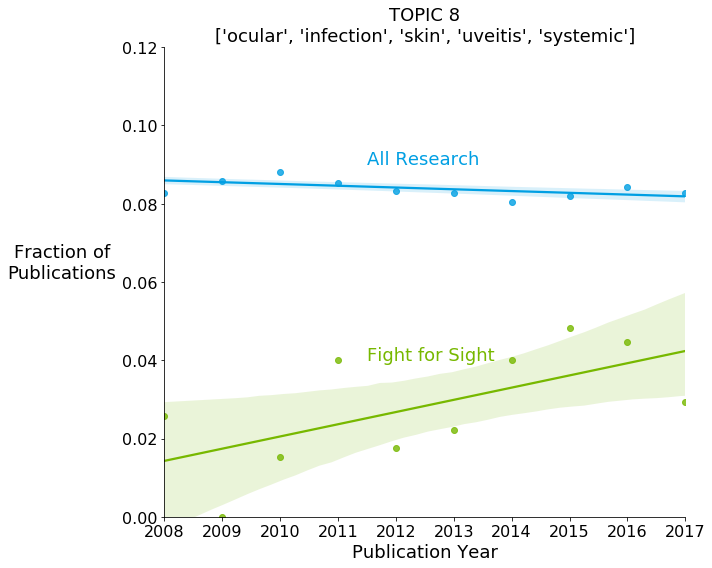

In [72]:
ffs_topic_by_year = 30*ffs_lda.groupby(pubYear).mean() # [lda_vectors.max(axis=1)>0.3]
ffs_topic_by_year = ffs_topic_by_year[(ffs_topic_by_year.index>2007) & (ffs_topic_by_year.index<2018)]

ffs_topic_by_year = ffs_lda[ffs_lda.max(axis=1)>0.1]
ffs_topic_by_year = ffs_topic_by_year>0.1
ffs_topic_by_year = ffs_topic_by_year.groupby(ffs_pubYear[ffs_lda.max(axis=1)>0.1]).mean()
ffs_topic_by_year = ffs_topic_by_year[(ffs_topic_by_year.index>2007) & (ffs_topic_by_year.index<2018)]


plt.figure(figsize=(10,8))

column = 8

X_eyekw = topic_by_year[column].index.values
y_eyekw = topic_by_year[column].values

X_ffs = ffs_topic_by_year[column].index.values
y_ffs = ffs_topic_by_year[column].values

ax = sns.regplot(x=X_eyekw, y=y_eyekw,label='All Research',color='#009fe3')
sns.regplot(x=X_ffs, y=y_ffs,label='Fight for Sight Research',color='#77b800')

#leg=plt.legend(fontsize=18,frameon=False)

top5_words = topics.loc[column].sort_values(ascending=False).head(5).index.tolist()
title = 'TOPIC {:d}\n{:s}'.format(column,str(top5_words))
plt.title(title,fontsize=18)
plt.xlim([2008,2017])
plt.ylim([0,0.12])

plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlabel('Publication Year',fontsize=18)
plt.ylabel('Fraction of\nPublications',
           rotation=0,fontsize=18, labelpad=60)

ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

plt.text(2011.5, 0.09, 'All Research',size=18,color='#009fe3')
plt.text(2011.5, 0.04, 'Fight for Sight',size=18,color='#77b800')

plt.tight_layout()
plt.savefig('plots/lda/topic'+str(column)+'.png',dpi=300)

In [28]:
topics['optic nerve'].sort_values(ascending=False)

43    16254.385588
4       657.961774
5        27.397158
49        0.020000
12        0.020000
21        0.020000
20        0.020000
19        0.020000
18        0.020000
17        0.020000
16        0.020000
15        0.020000
14        0.020000
13        0.020000
10        0.020000
11        0.020000
23        0.020000
9         0.020000
8         0.020000
7         0.020000
6         0.020000
3         0.020000
2         0.020000
1         0.020000
22        0.020000
24        0.020000
48        0.020000
25        0.020000
47        0.020000
46        0.020000
45        0.020000
44        0.020000
42        0.020000
41        0.020000
40        0.020000
39        0.020000
38        0.020000
37        0.020000
36        0.020000
35        0.020000
34        0.020000
33        0.020000
32        0.020000
31        0.020000
30        0.020000
29        0.020000
28        0.020000
27        0.020000
26        0.020000
0         0.020000
Name: optic nerve, dtype: float64

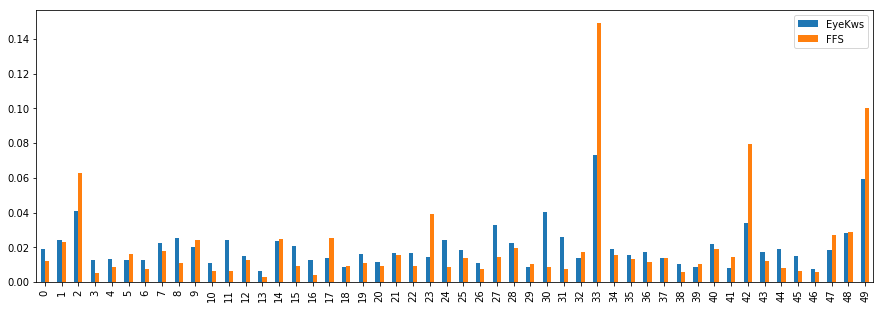

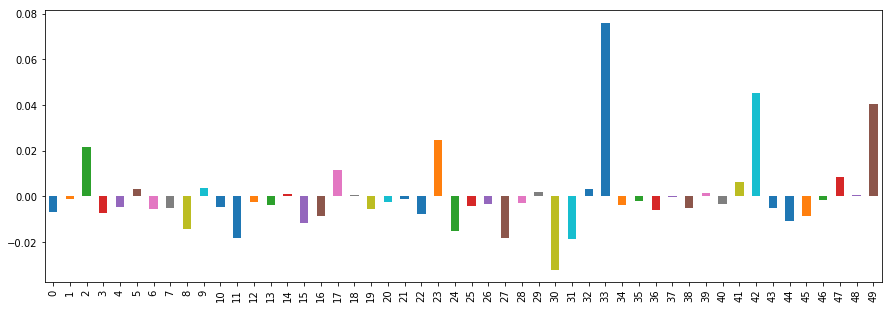

In [28]:
means_ffs_vs_eyekw = pd.DataFrame({'EyeKws':lda_vectors.mean(),'FFS':ffs_lda.mean()})

ax=plt.figure(figsize=(15,5)).gca()
means_ffs_vs_eyekw.plot.bar(ax=ax)

ax=plt.figure(figsize=(15,5)).gca()
(means_ffs_vs_eyekw['FFS']-means_ffs_vs_eyekw['EyeKws']).plot.bar(ax=ax)

In [29]:
topics['clinical trial'].sort_values(ascending=False)

12    8649.010717
27       6.316203
41       0.020001
49       0.020000
13       0.020000
21       0.020000
20       0.020000
19       0.020000
18       0.020000
17       0.020000
16       0.020000
15       0.020000
14       0.020000
11       0.020000
23       0.020000
10       0.020000
9        0.020000
8        0.020000
7        0.020000
6        0.020000
5        0.020000
4        0.020000
3        0.020000
2        0.020000
1        0.020000
22       0.020000
24       0.020000
48       0.020000
37       0.020000
47       0.020000
46       0.020000
45       0.020000
44       0.020000
43       0.020000
42       0.020000
40       0.020000
39       0.020000
38       0.020000
36       0.020000
25       0.020000
35       0.020000
34       0.020000
33       0.020000
32       0.020000
31       0.020000
30       0.020000
29       0.020000
28       0.020000
26       0.020000
0        0.020000
Name: clinical trial, dtype: float64

In [30]:
ffs = pd.read_pickle('data/EPMC/ffs_or_predecessors.pkl')
ffs.set_index('pmid',inplace=True)
ffs = ffs[~ffs.index.isnull()]

ffs.loc['29518076']

abstractText            Passive acoustic sensing has emerged as a powe...
authorList              [{'fullName': 'Mac Aodha O', 'firstName': 'Ois...
chemicalList                                                          NaN
citedByCount                                                            0
doi                                          10.1371/journal.pcbi.1005995
firstPublicationDate                                           2018-03-08
grantsList              [{'grantId': '1501/02', 'agency': 'Fight for S...
id                                                               29518076
journalInfo             {'issue': '3', 'volume': '14', 'journalIssueId...
keywordList                                                           NaN
meshHeadingList         [{'majorTopic_YN': 'N', 'descriptorName': 'Ani...
pmcid                                                          PMC5843167
pubYear                                                              2018
title                   Bat detective-

In [31]:
check = lda_vectors.loc['10995752']

similarities = cosine_similarity(check.values.reshape(1, -1),lda_vectors[lda_vectors.max(axis=1)>0.3])
similarities = pd.Series(similarities.squeeze(),index=lda_vectors[lda_vectors.max(axis=1)>0.3].index)
similarities.sort_values(ascending=False).head(30)



pmid
10995752    1.000000
11323417    0.992620
18992716    0.991506
22123608    0.989761
21637858    0.989045
15079818    0.988949
20237999    0.988738
24124169    0.988729
22811268    0.988522
26966681    0.988371
26746014    0.987941
24667410    0.987745
25918534    0.987719
15238362    0.987510
17553814    0.987349
18096572    0.987087
18270826    0.987060
23559126    0.987052
22867636    0.986931
26023237    0.986849
16384989    0.986201
23134995    0.985828
16765946    0.985800
27754889    0.985668
22944581    0.985561
18691180    0.985145
23661377    0.985001
19211566    0.984971
26486273    0.984723
10912786    0.984543
dtype: float64

In [32]:
lda_vectors[lda_vectors.max(axis=1)>0.3]

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
pmid,,,,,,,,,,,,,,,,,,,,,
30209082,0.000124,0.012691,0.000124,0.000124,0.000124,0.015494,0.000124,0.000124,0.000124,0.511752,...,0.000124,0.086914,0.000124,0.000124,0.149017,0.000124,0.000124,0.000124,0.000124,0.000124
30092731,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.000230,0.327270,0.000230,...,0.000230,0.000230,0.000230,0.039213,0.000230,0.029101,0.020563,0.021016,0.000230,0.000230
30270476,0.000114,0.036774,0.000114,0.059512,0.000114,0.007248,0.000114,0.000114,0.059631,0.000114,...,0.000114,0.000114,0.000114,0.000114,0.000114,0.000114,0.000114,0.007964,0.000114,0.348506
29799159,0.000136,0.000136,0.019546,0.000136,0.000136,0.053447,0.000136,0.000136,0.000136,0.008744,...,0.007186,0.024666,0.022055,0.613139,0.000136,0.000136,0.000136,0.000136,0.000136,0.000136
29545417,0.000120,0.000120,0.000120,0.000120,0.000120,0.006455,0.000120,0.000120,0.000120,0.663836,...,0.000120,0.081480,0.007505,0.000120,0.083859,0.000120,0.000120,0.000120,0.000120,0.051296
30240726,0.000103,0.000103,0.000103,0.000103,0.000103,0.000103,0.000103,0.000103,0.000103,0.799196,...,0.000103,0.000103,0.000103,0.000103,0.111650,0.000103,0.000103,0.000103,0.000103,0.000103
30255821,0.000161,0.000161,0.000161,0.000161,0.000161,0.073789,0.000161,0.000161,0.063089,0.000161,...,0.000161,0.000161,0.000161,0.000161,0.000161,0.000161,0.019072,0.000161,0.000161,0.022247
30127501,0.010020,0.000110,0.000110,0.000110,0.364250,0.018847,0.000110,0.006841,0.000110,0.000110,...,0.036905,0.000110,0.000110,0.055695,0.056657,0.000110,0.000110,0.000110,0.031582,0.000110
29984333,0.000154,0.000154,0.000154,0.000154,0.012784,0.000154,0.000154,0.000154,0.000154,0.000154,...,0.000154,0.000154,0.000154,0.151189,0.000154,0.000154,0.000154,0.000154,0.000154,0.000154


In [73]:
from tqdm import tqdm_notebook
#!pip install dit
from dit.divergences import jensen_shannon_divergence
import dit
checkdist = dit.ScalarDistribution(range(30),check.values)

jensen_similarities = []
for i in tqdm_notebook(range(len(lda_vectors))):
    refdist =  dit.ScalarDistribution(range(30), lda_vectors.iloc[i].values)
    div = jensen_shannon_divergence([checkdist, refdist])
    jensen_similarities.append(div)
    
jensen_similarities = pd.Series(jensen_similarities,index=lda_vectors.index)
jensen_similarities.sort_values()

pmid
10995752    0.000000
18992716    0.011287
21933838    0.020397
18077586    0.030447
15238362    0.037669
23806210    0.037960
22733143    0.040287
11438538    0.045222
12910240    0.046225
22790594    0.047059
18807137    0.049505
20577597    0.049754
25671433    0.050609
12089160    0.053518
10824670    0.054874
23028851    0.056663
19874812    0.056741
10821755    0.057043
25853464    0.057361
18096572    0.057584
12972005    0.058199
11169459    0.058353
25966166    0.058635
12966428    0.058901
19366616    0.059616
26394147    0.059906
19294396    0.060505
12692260    0.060563
18477895    0.060996
16251210    0.061187
              ...   
27992428    0.985163
18327140    0.985188
15218517    0.985197
22446886    0.985211
11020410    0.985263
19898177    0.985347
29957739    0.985408
24011520    0.985421
30193379    0.985451
22133795    0.985481
27566855    0.985488
24376575    0.985492
25972260    0.985514
23664153    0.985520
27573881    0.985529
20168271    0.985540
29789659